# Table of contents
1. [Introduction](#intro)
2. [Data Wrangling](#wrangling)
    1. [loading](#loading)
    2. [cleaning](#cleaning)
    3. [data selection](#data)
3. [Exploratory Data Analysis](#eda)
4. [Questions](#questions)

<a id='intro'></a>
## Introduction

<a id='gathering'></a>
## Gathering the data -- using Google BigQuery

<a id='loading'></a>
## loading

In [1]:
import csv
import pandas as pd
import numpy as np #import the stats library from numpy
from scipy import stats
from datetime import datetime
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib notebook
#%matplotlib inline
import seaborn as sns

from mpl_toolkits.basemap import Basemap
import folium
from folium import plugins
from folium.plugins import HeatMap
from folium.plugins import HeatMapWithTime



In [2]:
brooklyn_data = pd.read_csv('./data/brooklyn_extended_notnull')

nyc_deaths = pd.read_csv('./data/deaths_by_street.csv')
nyc_collisions = pd.read_csv('./data/collisions_by_type.csv')
brooklyn_deaths = pd.read_csv('./data/deaths_by_street_brooklyn.csv')

In [3]:
parse_dates = ['timestamp']

all_data = pd.read_csv('./data/all_accidents', dtype={
                                'borough': str,
                                'contributing_factor_vehicle_1': str,
                                'contributing_factor_vehicle_2': str,
                                'contributing_factor_vehicle_3': str,
                                'contributing_factor_vehicle_4': str,
                                'contributing_factor_vehicle_5': str,
                                'cross_street_name': str,
                                'latitude': float,
                                'longitude': float,
                                'off_street_name': str,
                                'on_street_name': str,
                                'unique_key': object,
                                'vehicle_type_code1': str,
                                'vehicle_type_code2': str,
                                'vehicle_type_code_3': str,
                                'vehicle_type_code_4': str,
                                'vehicle_type_code_5': str,
                                'zip_code': float,
                                'number_of_persons_killed': int,
                               }, parse_dates=parse_dates)


In [4]:
#make a copy
df_copy = brooklyn_data.copy()
nyc_deathsC = nyc_deaths.copy()
nyc_collisionsC = nyc_collisions.copy()
all_dataC = all_data.copy()

<a id='review'></a>
## review

In [5]:
all_data.head()

,borough,contributing_factor_vehicle_1,contributing_factor_vehicle_2,contributing_factor_vehicle_3,contributing_factor_vehicle_4,contributing_factor_vehicle_5,cross_street_name,timestamp,latitude,longitude,...,number_of_persons_killed,off_street_name,on_street_name,unique_key,vehicle_type_code1,vehicle_type_code2,vehicle_type_code_3,vehicle_type_code_4,vehicle_type_code_5,zip_code
0,QUEENS,Outside Car Distraction,Unspecified,NaN,NaN,NaN,GREENWAY SOUTH,2018-01-17 10:35:00+00:00,40.710400,-73.839740,...,0,NaN,UNION TURNPIKE,3830694,SPORT UTILITY / STATION WAGON,AM,NaN,NaN,NaN,11375.0
1,MANHATTAN,Fatigued/Drowsy,Other Vehicular,NaN,NaN,NaN,3 AVENUE,2015-05-08 17:30:00+00:00,40.780125,-73.953034,...,0,NaN,EAST 88 STREET,3216563,PASSENGER VEHICLE,MOTORCYCLE,NaN,NaN,NaN,10128.0
2,QUEENS,Driver Inattention/Distraction,Unspecified,NaN,NaN,NaN,NaN,2017-11-22 07:15:00+00:00,40.685524,-73.844600,...,0,99-08 97 STREET,NaN,3795174,PASSENGER VEHICLE,CONV,NaN,NaN,NaN,11416.0
3,BRONX,Turning Improperly,Unspecified,NaN,NaN,NaN,WESTCHESTER AVENUE,2017-12-05 07:30:00+00:00,40.832650,-73.863660,...,0,NaN,LELAND AVENUE,3803160,PASSENGER VEHICLE,BU,NaN,NaN,NaN,10472.0
4,BRONX,Driver Inattention/Distraction,Unspecified,NaN,NaN,NaN,NaN,2017-11-03 09:22:00+00:00,40.853233,-73.891750,...,0,4487 3 AVENUE,NaN,3794016,PASSENGER VEHICLE,TK,NaN,NaN,NaN,10457.0


In [6]:
nyc_collisions.head(10)

,collision_factor,num_collisions
0,Driver Inattention/Distraction,176170
1,Failure to Yield Right-of-Way,57298
2,Fatigued/Drowsy,48495
3,Backing Unsafely,37916
4,Other Vehicular,36038
5,Following Too Closely,31636
6,Turning Improperly,29288
7,Lost Consciousness,20261
8,Traffic Control Disregarded,16190
9,Prescription Medication,15904


In [7]:
nyc_deaths

,on_street_name,deaths
0,BROADWAY,23
1,ATLANTIC AVENUE,22
2,LINDEN BOULEVARD,16
3,HYLAN BOULEVARD,16
4,NORTHERN BOULEVARD,15
5,BRUCKNER BOULEVARD,15
6,3 AVENUE,15
7,ROCKAWAY BOULEVARD,14
8,FLATBUSH AVENUE,13
9,QUEENS BOULEVARD,12


In [8]:
brooklyn_deaths.head()

,on_street_name,deaths
0,ATLANTIC AVENUE,14
1,FLATBUSH AVENUE,10
2,LINDEN BOULEVARD,9
3,OCEAN PARKWAY,8
4,BEDFORD AVENUE,7


In [9]:
brooklyn_data.head()

,unique_key,borough,timestamp,location,zip_code,latitude,longitude,collision_factor,number_of_cyclist_injured,number_of_cyclist_killed,number_of_motorist_injured,number_of_motorist_killed,number_of_pedestrians_injured,number_of_pedestrians_killed,number_of_persons_injured,number_of_persons_killed
0,3810657,BROOKLYN,2017-12-15 08:00:00 UTC,"(40.61847, -74.021225)",11228.0,40.618470,-74.021225,Passenger Distraction,0,0,0,0,0,0,0,0
1,3770545,BROOKLYN,2017-10-12 12:10:00 UTC,"(40.71348, -73.965515)",11249.0,40.713480,-73.965515,Passing or Lane Usage Improper,0,0,0,0,0,0,0,0
2,3824908,BROOKLYN,2018-01-07 11:30:00 UTC,"(40.699482, -73.96104)",11249.0,40.699482,-73.961040,Following Too Closely,0,0,1,0,0,0,1,0
3,186233,BROOKLYN,2013-06-16 12:58:00 UTC,"(40.7037717, -73.9311561)",11237.0,40.703772,-73.931156,Unspecified,0,0,1,0,0,0,1,0
4,3818427,BROOKLYN,2017-12-26 10:50:00 UTC,"(40.67859, -73.99049)",11231.0,40.678590,-73.990490,Driver Inattention/Distraction,0,0,0,0,0,0,0,0


In [10]:
brooklyn_data.shape

(263715, 16)

In [11]:
#check nulls
brooklyn_data.isnull().any()

unique_key                       False
borough                          False
timestamp                        False
location                          True
zip_code                          True
latitude                          True
longitude                         True
collision_factor                  True
number_of_cyclist_injured        False
number_of_cyclist_killed         False
number_of_motorist_injured       False
number_of_motorist_killed        False
number_of_pedestrians_injured    False
number_of_pedestrians_killed     False
number_of_persons_injured        False
number_of_persons_killed         False
dtype: bool

In [12]:
#check duplicates
brooklyn_data.duplicated().sum()

0

In [13]:
brooklyn_data.nunique().sum()

566826

In [14]:
brooklyn_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 263715 entries, 0 to 263714
Data columns (total 16 columns):
unique_key                       263715 non-null int64
borough                          263715 non-null object
timestamp                        263715 non-null object
location                         254015 non-null object
zip_code                         263711 non-null float64
latitude                         254015 non-null float64
longitude                        254015 non-null float64
collision_factor                 262321 non-null object
number_of_cyclist_injured        263715 non-null int64
number_of_cyclist_killed         263715 non-null int64
number_of_motorist_injured       263715 non-null int64
number_of_motorist_killed        263715 non-null int64
number_of_pedestrians_injured    263715 non-null int64
number_of_pedestrians_killed     263715 non-null int64
number_of_persons_injured        263715 non-null int64
number_of_persons_killed         263715 non-null int64

<a id='cleaning'></a>
## Cleaning

In [15]:
#dtypes
all_dataC['timestamp'] = pd.to_datetime(all_dataC['timestamp'])
all_dataC['zip_code'] = pd.to_numeric(all_dataC['zip_code'], errors='coerce')
#rename
all_dataC = all_dataC.rename(columns={'contributing_factor_vehicle_1': 'collision_factor'})
#add count column
all_dataC['count']=1
#extract datetime data to create 3 additional columns
all_dataC['year'] = all_dataC.timestamp.dt.year
#not null or unspecified
all_dataC = all_dataC[pd.notnull(all_dataC['collision_factor'])]
all_dataC = all_dataC.drop(all_dataC[all_dataC['collision_factor']=='Unspecified'].index)

#select columns
all_dataC = all_dataC[['year', 'borough', 'collision_factor', 'unique_key', 'count']]

In [16]:
all_dataC.head()

,year,borough,collision_factor,unique_key,count
0,2018,QUEENS,Outside Car Distraction,3830694,1
1,2015,MANHATTAN,Fatigued/Drowsy,3216563,1
2,2017,QUEENS,Driver Inattention/Distraction,3795174,1
3,2017,BRONX,Turning Improperly,3803160,1
4,2017,BRONX,Driver Inattention/Distraction,3794016,1


### clean df_copy

In [17]:
#datatypes
df_copy['timestamp'] = pd.to_datetime(df_copy['timestamp'])
df_copy['zip_code'] = pd.to_numeric(df_copy['zip_code'], errors='coerce')

In [18]:
#extract datetime data to create 3 additional columns
df_copy['year'] = df_copy.timestamp.dt.year
df_copy['month'] = df_copy.timestamp.dt.month
df_copy['weekday'] = df_copy.timestamp.dt.weekday #The day of the week with Monday=0, Sunday=6
df_copy['hour'] = df_copy.timestamp.dt.hour
df_copy.head()

,unique_key,borough,timestamp,location,zip_code,latitude,longitude,collision_factor,number_of_cyclist_injured,number_of_cyclist_killed,number_of_motorist_injured,number_of_motorist_killed,number_of_pedestrians_injured,number_of_pedestrians_killed,number_of_persons_injured,number_of_persons_killed,year,month,weekday,hour
0,3810657,BROOKLYN,2017-12-15 08:00:00+00:00,"(40.61847, -74.021225)",11228.0,40.618470,-74.021225,Passenger Distraction,0,0,0,0,0,0,0,0,2017,12,4,8
1,3770545,BROOKLYN,2017-10-12 12:10:00+00:00,"(40.71348, -73.965515)",11249.0,40.713480,-73.965515,Passing or Lane Usage Improper,0,0,0,0,0,0,0,0,2017,10,3,12
2,3824908,BROOKLYN,2018-01-07 11:30:00+00:00,"(40.699482, -73.96104)",11249.0,40.699482,-73.961040,Following Too Closely,0,0,1,0,0,0,1,0,2018,1,6,11
3,186233,BROOKLYN,2013-06-16 12:58:00+00:00,"(40.7037717, -73.9311561)",11237.0,40.703772,-73.931156,Unspecified,0,0,1,0,0,0,1,0,2013,6,6,12
4,3818427,BROOKLYN,2017-12-26 10:50:00+00:00,"(40.67859, -73.99049)",11231.0,40.678590,-73.990490,Driver Inattention/Distraction,0,0,0,0,0,0,0,0,2017,12,1,10


In [19]:
#null count
#check for nulls and sort the list
df_copy.isnull().sum().sort_values(ascending=True)

unique_key                          0
month                               0
year                                0
number_of_persons_killed            0
number_of_persons_injured           0
number_of_pedestrians_killed        0
number_of_pedestrians_injured       0
number_of_motorist_killed           0
number_of_motorist_injured          0
number_of_cyclist_killed            0
number_of_cyclist_injured           0
timestamp                           0
borough                             0
weekday                             0
hour                                0
zip_code                            4
collision_factor                 1394
longitude                        9700
latitude                         9700
location                         9700
dtype: int64

In [20]:
b_collision_factor = df_copy[pd.notnull(df_copy['collision_factor'])]

In [21]:
#review
b_collision_factor.isnull().sum().sort_values(ascending=True)

unique_key                          0
month                               0
year                                0
number_of_persons_killed            0
number_of_persons_injured           0
number_of_pedestrians_killed        0
number_of_pedestrians_injured       0
number_of_motorist_killed           0
number_of_motorist_injured          0
number_of_cyclist_killed            0
number_of_cyclist_injured           0
collision_factor                    0
timestamp                           0
borough                             0
weekday                             0
hour                                0
zip_code                            4
longitude                        9671
latitude                         9671
location                         9671
dtype: int64

In [22]:
# Removing outliers and unrecorded zip code values from the data
#(i.e. zero values and those outside the NTC city limits)
b_collision_factor = b_collision_factor[(b_collision_factor['latitude'] > 0.1) & (b_collision_factor['latitude'] < 41)]

In [23]:
# review location (using Basemap)

# create a map to review geographic dispersal of data
# resources: https://makersportal.com/blog/2018/7/20/geographic-mapping-from-a-csv-file-using-python-and-basemap
# resources: https://jakevdp.github.io/PythonDataScienceHandbook/04.13-geographic-data-with-basemap.html

# Extract the coordinates data
lats = b_collision_factor['latitude'].values
lons = b_collision_factor['longitude'].values

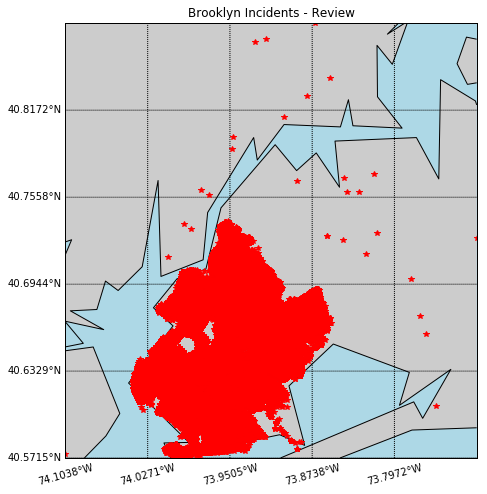

In [24]:
# How much to zoom from coordinates (in degrees)
zoom_scale = 0

# Setup the bounding box for the zoom and bounds of the map
bbox = [np.min(lats)-zoom_scale,np.max(lats)+zoom_scale,\
        np.min(lons)-zoom_scale,np.max(lons)+zoom_scale]

fig, ax = plt.subplots(figsize=(15,8))

# Define the projection, scale, the corners of the map, and the resolution.
m = Basemap(projection='merc',llcrnrlat=bbox[0],urcrnrlat=bbox[1],\
            llcrnrlon=bbox[2],urcrnrlon=bbox[3],lat_ts=10,resolution='i')

# Draw coastlines and fill continents and water with color
m.drawcoastlines()
m.fillcontinents(color='#CCCCCC',lake_color='lightblue')

# draw parallels, meridians, and color boundaries
m.drawparallels(np.arange(bbox[0],bbox[1],(bbox[1]-bbox[0])/5),labels=[1,0,0,0])
m.drawmeridians(np.arange(bbox[2],bbox[3],(bbox[3]-bbox[2])/5),labels=[0,0,0,1],rotation=15)
m.drawmapboundary(fill_color='lightblue')

# build and plot coordinates onto map
x,y = m(lons,lats)
m.plot(x,y,'r*',color='r')
plt.title("Brooklyn Incidents - Review")
plt.savefig('figs/zip_brooklyn_incidents_review.png', format='png', dpi=500)
plt.show()

In [25]:
b_collision_factor['latitude'].describe()

count    252634.000000
mean         40.656073
std           0.035439
min          40.571521
25%          40.630905
50%          40.658646
75%          40.682014
max          40.878643
Name: latitude, dtype: float64

In [26]:
# Removing outlier zip code values from the data
#(i.e. those outside the Brooklyn limits)
#b_collision_factor = b_collision_factor[(b_collision_factor['latitude'] < 40.7558)]

coor_outside_brooklyn = b_collision_factor[(b_collision_factor['longitude'] < 73.85) & 
                                        (b_collision_factor['latitude'] > 40.7558)
                                       ].index

b_collision_factor.drop(coor_outside_brooklyn, inplace=True)

In [27]:
b_collision_factor['latitude'].describe()

count    252619.000000
mean         40.656065
std           0.035421
min          40.571521
25%          40.630905
50%          40.658646
75%          40.682006
max          40.738853
Name: latitude, dtype: float64

In [28]:
# Extract the coordinates data
lat = b_collision_factor['latitude'].values
lon = b_collision_factor['longitude'].values

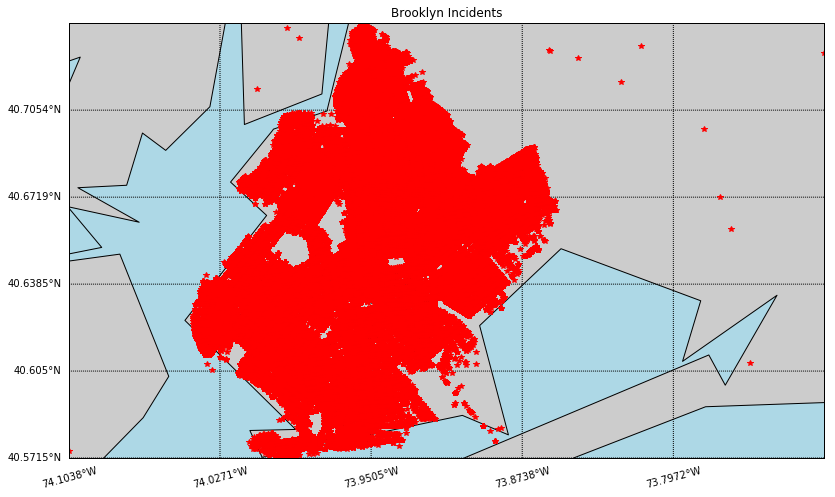

In [29]:
# How much to zoom from coordinates (in degrees)
zoom_scale = 0

# Setup the bounding box for the zoom and bounds of the map
bbox = [np.min(lat)-zoom_scale,np.max(lat)+zoom_scale,\
        np.min(lon)-zoom_scale,np.max(lon)+zoom_scale]

fig, ax = plt.subplots(figsize=(15,8))

# Define the projection, scale, the corners of the map, and the resolution.
m = Basemap(projection='merc',llcrnrlat=bbox[0],urcrnrlat=bbox[1],\
            llcrnrlon=bbox[2],urcrnrlon=bbox[3],lat_ts=10,resolution='i')

# Draw coastlines and fill continents and water with color
m.drawcoastlines()
m.fillcontinents(color='#CCCCCC',lake_color='lightblue')

# draw parallels, meridians, and color boundaries
m.drawparallels(np.arange(bbox[0],bbox[1],(bbox[1]-bbox[0])/5),labels=[1,0,0,0])
m.drawmeridians(np.arange(bbox[2],bbox[3],(bbox[3]-bbox[2])/5),labels=[0,0,0,1],rotation=15)
m.drawmapboundary(fill_color='lightblue')

# build and plot coordinates onto map
x,y = m(lon,lat)
m.plot(x,y,'r*',color='r')
plt.title("Brooklyn Incidents")
plt.savefig('figs/zip_brooklyn_incidents.png', format='png', dpi=500)
plt.show()

<a id='eda'></a>
## Exploratory Data Analysis

In [30]:
#top collision factors by year, by borough
df_agg = all_dataC.groupby(['borough','year', 'collision_factor']).agg({'count':sum})
g = df_agg['count'].groupby(level=0, group_keys=False)
g.nlargest(5)

borough        year  collision_factor              
BRONX          2017  Driver Inattention/Distraction    3464
               2015  Driver Inattention/Distraction    3049
               2016  Driver Inattention/Distraction    2451
               2013  Driver Inattention/Distraction    2108
               2014  Driver Inattention/Distraction    2027
BROOKLYN       2017  Driver Inattention/Distraction    9254
               2015  Driver Inattention/Distraction    5781
               2016  Driver Inattention/Distraction    5298
               2014  Driver Inattention/Distraction    4426
               2013  Driver Inattention/Distraction    3513
MANHATTAN      2017  Driver Inattention/Distraction    8697
               2015  Driver Inattention/Distraction    6772
               2014  Driver Inattention/Distraction    5595
               2013  Driver Inattention/Distraction    5413
               2016  Driver Inattention/Distraction    5361
QUEENS         2017  Driver Inattention/Distract

In [31]:
#top collision factors by borough
df_agg2 = all_dataC.groupby(['borough', 'collision_factor']).agg({'count':sum})
g2 = df_agg2['count'].groupby(level=0, group_keys=False)
g2.nlargest(5)

borough        collision_factor              
BRONX          Driver Inattention/Distraction    14248
               Other Vehicular                    4241
               Failure to Yield Right-of-Way      4177
               Backing Unsafely                   3982
               Fatigued/Drowsy                    2341
BROOKLYN       Driver Inattention/Distraction    30524
               Failure to Yield Right-of-Way     14382
               Backing Unsafely                   8805
               Fatigued/Drowsy                    7870
               Lost Consciousness                 5020
MANHATTAN      Driver Inattention/Distraction    34731
               Other Vehicular                   13935
               Failure to Yield Right-of-Way      8771
               Turning Improperly                 8471
               Fatigued/Drowsy                    8424
QUEENS         Driver Inattention/Distraction    35360
               Failure to Yield Right-of-Way     15116
               Back

### location (using Folium)

In [33]:
def generateBaseMap(default_location=[40.65, -73.94], default_zoom_start=12):
    base_map = folium.Map(location=default_location, control_scale=True, zoom_start=default_zoom_start)
    return base_map

In [34]:
# Filter the DF for rows, then columns
#heat_df = b_collision_factor[b_collision_factor['year']==2015] # Reducing data size so it runs faster
#heat_df = b_collision_factor[b_collision_factor.year>2016]


heat_df = b_collision_factor[['latitude', 'longitude', 'hour', 'number_of_persons_killed','number_of_persons_injured']] 
heat_df = heat_df.dropna(axis=0, subset=['latitude','longitude'])
heat_df['count']=1

In [35]:
base_map = generateBaseMap()

HeatMap(data=heat_df[['latitude', 'longitude', 'count']].groupby(['latitude', 'longitude']).sum().reset_index().values.tolist(), radius=8, max_zoom=13).add_to(base_map)

base_map

In [36]:
# Filter the DF for rows, then columns
heat_df_fatal = heat_df[heat_df['number_of_persons_killed']>1]

In [37]:
heat_df_fatal

,latitude,longitude,hour,number_of_persons_killed,number_of_persons_injured,count
46263,40.645704,-73.901433,11,2,0,1
105437,40.703159,-73.965874,0,3,1,1
182884,40.597682,-73.966850,2,3,3,1
225276,40.650518,-73.923586,4,2,1,1
255950,40.609810,-73.922498,18,2,2,1


In [38]:
#TO DO -- fix view
HeatMap(data=heat_df_fatal[['latitude', 'longitude', 'count']].groupby(['latitude', 'longitude']).sum().reset_index().values.tolist(), radius=8, max_zoom=13).add_to(base_map)

base_map


In [39]:
df_hour_list = []

for hour in heat_df.hour.sort_values().unique():
    df_hour_list.append(
        heat_df.loc[heat_df.hour == hour,['latitude', 'longitude', 'count']
                   ].groupby(['latitude', 'longitude']).sum().reset_index().values.tolist())

In [40]:
df_hour_list

[[[40.5728742, -73.99490300000001, 1.0],
  [40.5728961, -73.9946762, 1.0],
  [40.57343, -73.99175, 1.0],
  [40.5740047, -73.989687, 1.0],
  [40.57448, -73.9973722, 1.0],
  [40.574558, -73.9810045, 1.0],
  [40.5745946, -73.98763509999999, 2.0],
  [40.574877799999996, -73.9740282, 1.0],
  [40.574886, -73.9739886, 1.0],
  [40.57508, -73.98991, 1.0],
  [40.57529, -73.97655, 1.0],
  [40.57530379999999, -73.976609, 3.0],
  [40.5753363, -73.99643990000001, 1.0],
  [40.575382, -73.98380999999999, 1.0],
  [40.5754964, -73.9787796, 1.0],
  [40.575537700000005, -73.97963990000001, 1.0],
  [40.575565000000005, -73.98121, 1.0],
  [40.575565399999995, -73.9812022, 3.0],
  [40.575573, -73.99432, 2.0],
  [40.575575, -73.994316, 1.0],
  [40.5756326, -73.96394140000001, 1.0],
  [40.575714700000006, -73.9630091, 1.0],
  [40.5760414, -73.9900755, 1.0],
  [40.5761593, -73.9890171, 1.0],
  [40.5762151, -73.9765223, 1.0],
  [40.5762818, -73.98139640000001, 1.0],
  [40.57629, -73.968544, 1.0],
  [40.576303700

In [41]:
HeatMapWithTime(df_hour_list, 
                radius=5, 
                gradient={0.2: 'blue', 0.4: 'lime', 0.6: 'orange', 1: 'red'}, 
                min_opacity=0.5, 
                max_opacity=0.8, 
                use_local_extrema=True).add_to(base_map)

base_map

### zipcode

In [42]:
b_collision_factor['zip_code'].value_counts(5).head(5)

11207.0    0.057387
11201.0    0.040916
11203.0    0.039708
11236.0    0.038081
11234.0    0.037194
Name: zip_code, dtype: float64

In [43]:
# Obtaining total number of collisions for each zip code

zip_codes = b_collision_factor['zip_code'].value_counts().to_frame().reset_index().rename(columns={"zip_code": "zip_count"})

In [44]:
zip_codes

,index,zip_count
0,11207.0,14497
1,11201.0,10336
2,11203.0,10031
3,11236.0,9620
4,11234.0,9396
5,11226.0,9145
6,11212.0,8351
7,11208.0,8228
8,11220.0,8166
9,11230.0,8096


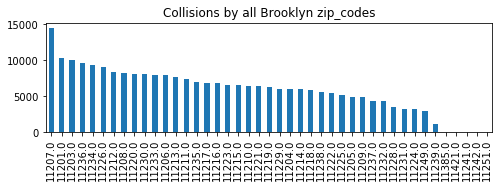

In [45]:
b_collision_factor['zip_code'].value_counts().plot(kind='bar', figsize=(8,4))
plt.title('Collisions by all Brooklyn zip_codes')
plt.show

plt.gcf().subplots_adjust(bottom=0.5)
plt.savefig('figs/collisions_by_zips_all.png', bbox_inches = "tight");

In [46]:
#create a list of top 10 zipcodes with highest number of collisions
top_10_zips = list(b_collision_factor['zip_code'].value_counts().nlargest(10).index)
print(top_10_zips)

[11207.0, 11201.0, 11203.0, 11236.0, 11234.0, 11226.0, 11212.0, 11208.0, 11220.0, 11230.0]


In [47]:
#create df for top zips
df_top_zips = b_collision_factor[b_collision_factor['zip_code'].isin(top_10_zips)]

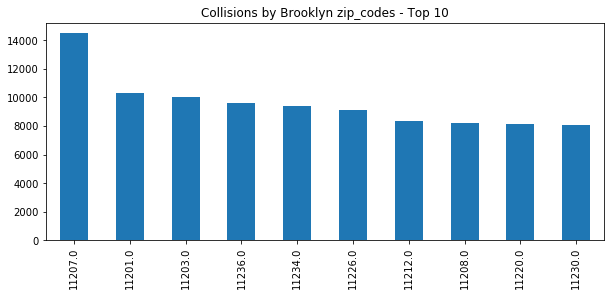

<Figure size 432x288 with 0 Axes>

In [48]:
df_top_zips['zip_code'].value_counts().plot(kind='bar', figsize=(10,4))
plt.title('Collisions by Brooklyn zip_codes - Top 10')
plt.show()
plt.savefig('figs/collisions_by_zip.png');

### year

In [49]:
# Preparing data to observe the number of collisions over the years

year = b_collision_factor[['number_of_cyclist_injured',
                           'number_of_cyclist_killed',
                           'number_of_motorist_injured',
                           'number_of_motorist_killed',
                           'number_of_pedestrians_injured',
                           'number_of_pedestrians_killed',
                           'number_of_persons_injured',
                           'number_of_persons_killed',
                           'year',
                          ]]

In [50]:
year_killed = b_collision_factor[['number_of_cyclist_killed',
                           'number_of_motorist_killed',
                           'number_of_pedestrians_killed',
                           'number_of_persons_killed',
                           'year',
                          ]]

In [51]:
year.groupby('year').sum()

,number_of_cyclist_injured,number_of_cyclist_killed,number_of_motorist_injured,number_of_motorist_killed,number_of_pedestrians_injured,number_of_pedestrians_killed,number_of_persons_injured,number_of_persons_killed
year,,,,,,,,
2012,878,2,4805,12,1836,19,7525,33
2013,1539,4,10228,33,3632,30,15399,67
2014,1407,4,9482,21,3337,42,14227,67
2015,1512,4,9150,17,3012,46,13674,67
2016,1046,5,7009,5,2331,14,10570,24
2017,1284,8,7893,11,2549,18,11454,36
2018,34,0,405,0,147,1,586,1


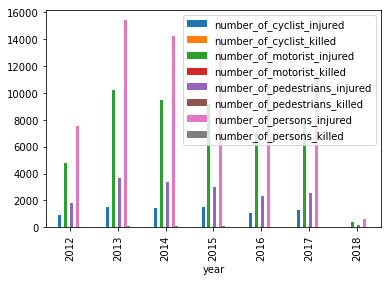

In [52]:
year.groupby('year').sum().plot(kind='bar')
plt.savefig('figs/fatalities_by_year_all.png');

In [53]:
year_killed.groupby('year').sum()

,number_of_cyclist_killed,number_of_motorist_killed,number_of_pedestrians_killed,number_of_persons_killed
year,,,,
2012,2,12,19,33
2013,4,33,30,67
2014,4,21,42,67
2015,4,17,46,67
2016,5,5,14,24
2017,8,11,18,36
2018,0,0,1,1


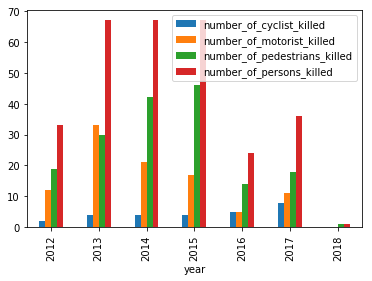

In [54]:
year_killed.groupby('year').sum().plot(kind='bar')
plt.savefig('figs/fatalities_by_year.png');

In [55]:
df2 = year.set_index('year')
mapping = {'number_of_cyclist_killed': 'fatal',
           'number_of_motorist_injured': 'injured',
           'number_of_motorist_killed': 'fatal',
           'number_of_pedestrians_injured': 'injured',
           'number_of_pedestrians_killed': 'fatal',
           'number_of_persons_injured': 'injured',
           'number_of_persons_killed': 'fatal'}
display('df2', 'df2.groupby(mapping).sum()')

'df2'

'df2.groupby(mapping).sum()'

### type 

In [56]:
b_collision_factor.groupby('collision_factor').sum()

,unique_key,zip_code,latitude,longitude,number_of_cyclist_injured,number_of_cyclist_killed,number_of_motorist_injured,number_of_motorist_killed,number_of_pedestrians_injured,number_of_pedestrians_killed,number_of_persons_injured,number_of_persons_killed,year,month,weekday,hour
collision_factor,,,,,,,,,,,,,,,,
Accelerator Defective,271368038,1.312502e+06,4.757137e+03,-8.653454e+03,0,0,47,0,6,0,53,0,235739,763,326,1524
Aggressive Driving/Road Rage,1950066239,9.031156e+06,3.273191e+04,-5.953101e+04,28,0,211,0,112,0,345,0,1622055,5403,2350,10668
Alcohol Involvement,4911118542,2.365038e+07,8.570025e+04,-1.558920e+05,69,1,810,5,79,3,953,9,4247589,14485,7717,21380
Animals Action,273280218,1.166870e+06,4.227385e+03,-7.691069e+03,1,0,36,0,0,0,37,0,209580,685,377,1171
Backing Unsafely,21150730401,9.614249e+07,3.483878e+05,-6.337656e+05,46,0,387,0,528,8,956,8,17267597,57990,24114,116372
Brakes Defective,1557171053,7.561792e+06,2.740427e+04,-4.984395e+04,10,0,311,0,12,0,332,0,1358054,4552,2051,8868
Cell Phone (hand-held),119779095,4.711670e+05,1.707762e+03,-3.105803e+03,1,0,9,0,1,0,11,0,84656,298,152,599
Cell Phone (hands-free),108609355,5.831670e+05,2.114535e+03,-3.846061e+03,1,0,11,0,3,0,15,0,104743,368,128,750
Driver Inattention/Distraction,75995706470,3.321349e+08,1.203371e+06,-2.189222e+06,1064,3,5583,5,2083,26,8691,34,59655199,201886,85145,397945


In [57]:
# Obtaining total number of collisions by factor

factors = b_collision_factor['collision_factor'].value_counts().to_frame().reset_index().rename(columns={"factor": "factor_count"})

In [58]:
factors

,index,collision_factor
0,Unspecified,139593
1,Driver Inattention/Distraction,29602
2,Failure to Yield Right-of-Way,14077
3,Backing Unsafely,8569
4,Fatigued/Drowsy,7862
5,Lost Consciousness,5009
6,Other Vehicular,4831
7,Turning Improperly,3994
8,Prescription Medication,3784
9,Following Too Closely,3674


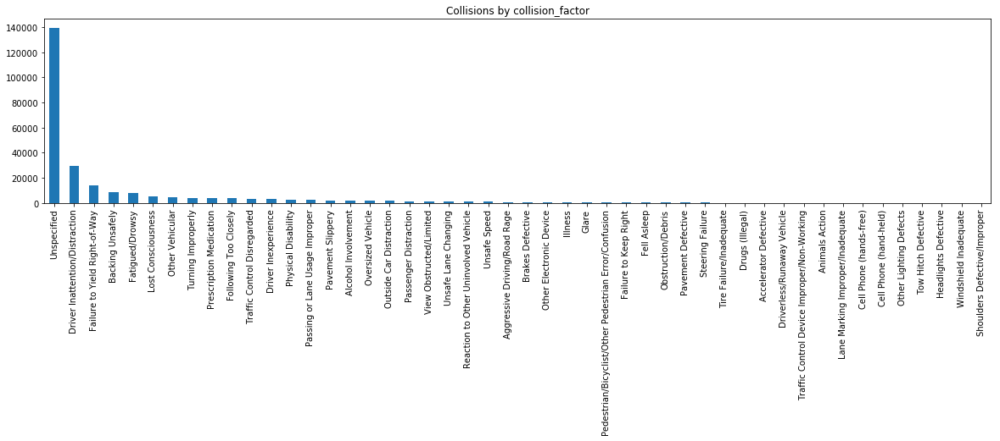

In [59]:
b_collision_factor['collision_factor'].value_counts().plot(kind='bar', figsize=(20,4))
plt.title('Collisions by collision_factor')
plt.show
plt.savefig('figs/collisions_by_factor_all.png');

In [60]:
#create a list of top 10 zipcodes with highest number of collisions
top_5_factors = list(b_collision_factor['collision_factor'].value_counts().nlargest(5).index)
print(top_5_factors)

['Unspecified', 'Driver Inattention/Distraction', 'Failure to Yield Right-of-Way', 'Backing Unsafely', 'Fatigued/Drowsy']


In [61]:
#create df for top zips
df_top_factors = b_collision_factor[b_collision_factor['collision_factor'].isin(top_5_factors)]

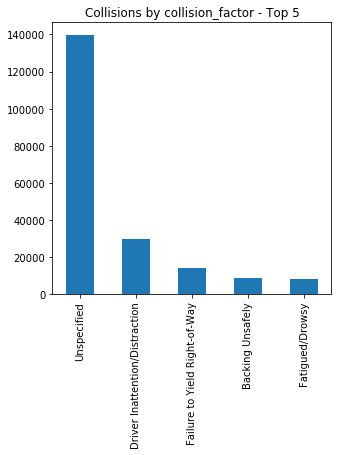

<Figure size 432x288 with 0 Axes>

In [62]:
df_top_factors['collision_factor'].value_counts().plot(kind='bar', figsize=(5,5))
plt.title('Collisions by collision_factor - Top 5')
plt.show()
plt.savefig('figs/collisions_by_factor.png');

In [63]:
b_collision_factor.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 252619 entries, 0 to 263714
Data columns (total 20 columns):
unique_key                       252619 non-null int64
borough                          252619 non-null object
timestamp                        252619 non-null datetime64[ns, UTC]
location                         252619 non-null object
zip_code                         252618 non-null float64
latitude                         252619 non-null float64
longitude                        252619 non-null float64
collision_factor                 252619 non-null object
number_of_cyclist_injured        252619 non-null int64
number_of_cyclist_killed         252619 non-null int64
number_of_motorist_injured       252619 non-null int64
number_of_motorist_killed        252619 non-null int64
number_of_pedestrians_injured    252619 non-null int64
number_of_pedestrians_killed     252619 non-null int64
number_of_persons_injured        252619 non-null int64
number_of_persons_killed         252619 n

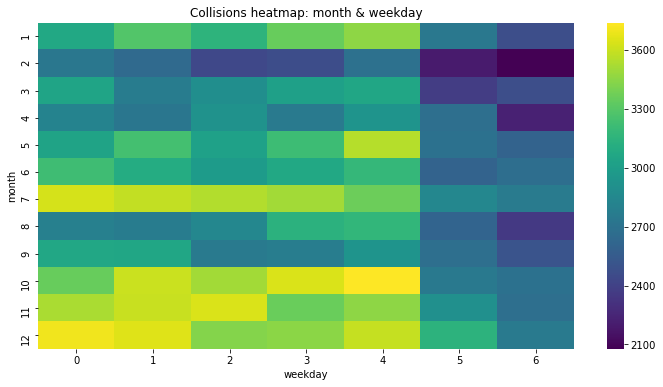

In [64]:
#heatmap of month and dayofthemonth
dayHour = b_collision_factor.groupby(by=['month', 'weekday']).count()['collision_factor'].unstack()
dayHour.head()
plt.figure(figsize=(12, 6))
plt.title('Collisions heatmap: month & weekday')
sns.heatmap(dayHour, cmap='viridis')
plt.savefig('figs/collisions_heatmap_month_weekday.png');

#The day of the week with Monday=0, Sunday=6

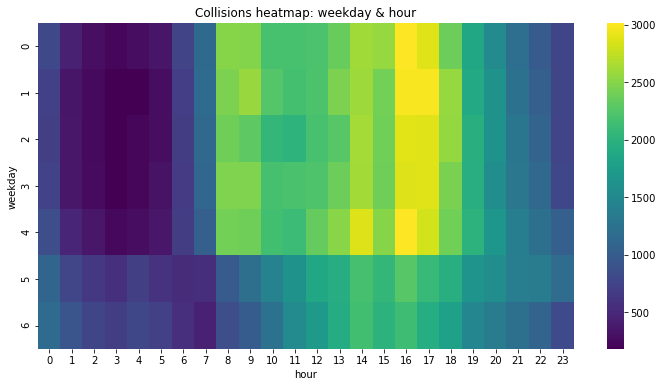

In [65]:
#heatmap of month and dayofthemonth
dayHour = b_collision_factor.groupby(by=['weekday', 'hour']).count()['collision_factor'].unstack()
dayHour.head()
plt.figure(figsize=(12, 6))
plt.title('Collisions heatmap: weekday & hour')
sns.heatmap(dayHour, cmap='viridis')
plt.savefig('figs/collisions_heatmap_weekday_hour.png');

In [69]:
from subprocess import call
call(['python', '-m', 'nbconvert', 'BrooklynMVC_analysis.ipynb'])

1

In [ ]:
import pdfkit

pdfkit.from_file('BrooklynMVC_analysis.html', 'BrooklynMVC_analysis.pdf')

In [ ]:
TO DO 